# Welcome To The Notebook
In this project, we are going to learn how to analyze Geo-spatial data using python and folium.


## TASK 1
Importing modules

In [1]:
import pandas as pd 
import datetime , calendar
import folium

Importing our data

In [2]:
data = pd.read_csv("dataset.csv")
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499..."
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351..."
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)..."
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705..."
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)..."


### Let's talk about the different columns
---
- CALL_TYPE: The way used to demand taxi service
    - 'A' : if this trip was dispatched from the central
    - 'B' : if this trip was demanded directly to a taxi driver on a specific stand 
    - 'C' : other (i.e. a trip demanded on a random street)

- TIMESTAMP: When the trip starts 

- TRIP_PATH: Contains a list of coordinates
    - The first element is the coordinates of the trip's starting point
    - The last element is the coordinates of the trip's end point

## TASK 2
### Data Preprocessing 
Let's extract starting and ending points of each trip <br>

    - Creating two columns START_LOC and END_LOC

In [3]:
data.TRIP_PATH = data.TRIP_PATH.apply(eval)

data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499..."
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351..."
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)..."
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705..."
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)..."


In [4]:
extract_starting_point = lambda list_ : list_[0]
extract_ending_point = lambda list_ : list_[-1]

data['START_LOC'] = data.TRIP_PATH.apply(extract_starting_point)
data['END_LOC'] = data.TRIP_PATH.apply(extract_ending_point)

data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


Remapping CALL_TYPE column values to the proper values

In [5]:
CALL_TYPES = {
              "A":"CENTRAL_BASED",
              "B":"STAND_BASED",
              "C":"OTHER"
             }

data.CALL_TYPE = data.CALL_TYPE.map(CALL_TYPES)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


### Data Analysis 
Let's answer to some analytical questions using our data 
 
 

### Question 1 - What are the most common ways to get a taxi in Porto?

<AxesSubplot:>

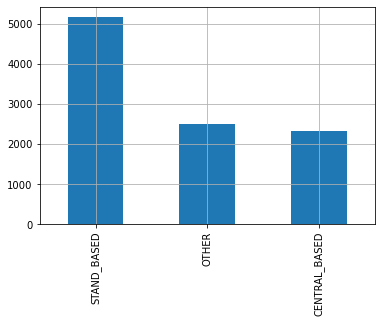

In [6]:
q1 = data.CALL_TYPE.value_counts()
q1.plot.bar(grid = True)

# TASK 3

### Question 2 - Which regions of the city are the best pick up points?
    To answer to this question we can use a dotmap.
    A dotmap is a scatter plot which is put on a map to represent a geographic data distribution.
    And then by looking at the different clusters of the points on the map we can get the answer.

Let's load our map 

In [7]:
q2 = folium.Map(location = [41.15, -8.62], zoom_start = 14)

for point in data.START_LOC:
    folium.CircleMarker(location = point, color = 'red', radius = 1, weight = 2).add_to(q2)
    
q2

### Question 3 - Which regions of the city are the best pick up points for stand-based trips?
    To answer to this question we create a dotmap with different Marker clusters, each cluster corresponds to a specific
    CALL_TYPE.

Let's check our data again 

In [8]:
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


Let's create our map

In [9]:
q3 = folium.Map(location = [41.15, -8.62], zoom_start = 14)

colors = {
    "OTHER" : "purple",
    "STAND_BASED" : "red",
    "CENTRAL_BASED" : "blue"
}

q3_data = data[['CALL_TYPE', 'START_LOC']]

for index, row in q3_data.iterrows():
    color = colors[row['CALL_TYPE']]
    location = row['START_LOC']
    folium.CircleMarker(location, color = color, radius = 1, weight = 2).add_to(q3)
    
q3  

## TASK 4
### Question 4 - Which regions of the city are the most common destinations on Mondays? 
    To answer to this question we need to use the TIMESTAMP column to extract the day each trip took place. 

In [10]:
day_names = list(calendar.day_name)

In [11]:
get_day = lambda timestamp : day_names[datetime.datetime.fromtimestamp(timestamp).weekday()]
data['week_day'] = data.TIMESTAMP.apply(get_day)

data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Sunday
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Sunday
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Sunday
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Sunday
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Sunday


Let's get all the trips on Mondays 

In [12]:
q4_data = data[data.week_day == 'Monday']
q4_data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day
443,1372662532620000051,STAND_BASED,1372662532,"[(41.140692, -8.615601), (41.140854, -8.615349...","(41.140692, -8.615601)","(41.147145, -8.615223)",Monday
450,1372662153620000351,OTHER,1372662153,"[(41.236965, -8.670015), (41.235633, -8.669727...","(41.236965, -8.670015)","(41.16888, -8.590365)",Monday
454,1372663182620000247,CENTRAL_BASED,1372663182,"[(41.157639, -8.593767), (41.156982, -8.594208...","(41.157639, -8.593767)","(41.147154, -8.617599)",Monday
464,1372662071620000662,OTHER,1372662071,"[(41.156559, -8.641611), (41.156541, -8.641431...","(41.156559, -8.641611)","(41.155875, -8.620776)",Monday
465,1372662631620000621,CENTRAL_BASED,1372662631,"[(41.159079, -8.611902), (41.159061, -8.611911...","(41.159079, -8.611902)","(41.149764, -8.619696)",Monday


Now Let's visualize the data on the map

In [13]:
q4 = folium.Map(location = [41.15, -8.62], zoom_start = 14)

for loc in q4_data.END_LOC:
    folium.CircleMarker(loc, color = 'red', radius = 1, weight = 2).add_to(q4)
    
q4

### Question 5 - What are the most common start and end points on Monday Mornings (from 6 am to 9 am)?
    To answer to this question we need to extract the hour information for each of the trips. 

Let's extract the hour column from TIMESTAMP column 

In [14]:
extract_hour = lambda timestamp : datetime.datetime.fromtimestamp(timestamp).hour

data['hour'] = data.TIMESTAMP.apply(extract_hour)
data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Sunday,17
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Sunday,17
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Sunday,17
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Sunday,17
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Sunday,17


Let's get the trips which took place between 6 am to 9 am on Mondays

In [15]:
q5_data = data[(data.week_day == 'Monday') & (data.hour > 6) & (data.hour < 9)]

q5_data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
2376,1372687382620000167,STAND_BASED,1372687382,"[(41.147766, -8.6202), (41.147442, -8.621181),...","(41.147766, -8.6202)","(41.152464, -8.627031)",Monday,7
2414,1372687571620000562,STAND_BASED,1372687571,"[(41.145687, -8.610858), (41.145768, -8.610876...","(41.145687, -8.610858)","(41.150781, -8.622954)",Monday,7
2422,1372687466620000372,STAND_BASED,1372687466,"[(41.154498, -8.649315), (41.154237, -8.649747...","(41.154498, -8.649315)","(41.173848, -8.688843)",Monday,7
2425,1372687350620000408,CENTRAL_BASED,1372687350,"[(41.151573, -8.566362), (41.151555, -8.566335...","(41.151573, -8.566362)","(41.151816, -8.609661)",Monday,7
2434,1372687233620000426,STAND_BASED,1372687233,"[(41.148621, -8.585856), (41.148909, -8.585811...","(41.148621, -8.585856)","(41.154561, -8.649477)",Monday,7


Now let's visualize this data

In [16]:
q5 = folium.Map(location = [41.15, -8.62], zoom_start = 14)

put_start_loc = lambda loc : folium.CircleMarker(loc, color = 'red', radius = 1, weight = 2).add_to(q5)
put_end_loc = lambda loc : folium.CircleMarker(loc, color = 'blue', radius = 1, weight = 2).add_to(q5)

q5_data.START_LOC.apply(put_start_loc)
q5_data.END_LOC.apply(put_end_loc)

q5

## TASK 5
### Question 6 - Find out the rush hour in Porto

<AxesSubplot:>

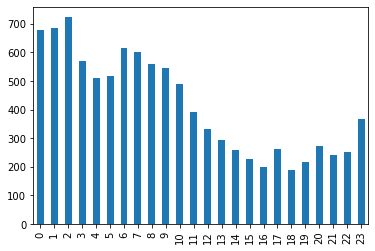

In [17]:
data.hour.value_counts().sort_index().plot.bar()

# my data shows 2AM, but following the guided project I will use 9AM

### Question 7 - Which streets has the more traffic during the rush hour
    To answer to this question we need to use TRIP_PATH column to visualize each path as a line on the map.
    Firstly, let's filter out the needed data. 

In [18]:
q7_data = data[data.hour == 9]
q7_data.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,START_LOC,END_LOC,week_day,hour
3014,1372695319620000046,STAND_BASED,1372695319,"[(41.169816, -8.628786), (41.169816, -8.628777)]","(41.169816, -8.628786)","(41.169816, -8.628777)",Monday,9
3032,1372694881620000516,STAND_BASED,1372694881,"[(41.140701, -8.615538), (41.140701, -8.615538...","(41.140701, -8.615538)","(41.133996, -8.614242)",Monday,9
3038,1372695283620000113,STAND_BASED,1372695283,"[(41.169618, -8.589339), (41.169726, -8.589276...","(41.169618, -8.589339)","(41.151591, -8.632737)",Monday,9
3048,1372695111620000327,STAND_BASED,1372695111,"[(41.148531, -8.58564), (41.148972, -8.585775)...","(41.148531, -8.58564)","(41.146335, -8.611641)",Monday,9
3053,1372694966620000621,STAND_BASED,1372694966,"[(41.167332, -8.649585), (41.166801, -8.649639...","(41.167332, -8.649585)","(41.160708, -8.667981)",Monday,9


In [19]:
q7 = folium.Map(location = [41.15, -8.62], zoom_start = 14)

for coords in q7_data.TRIP_PATH:
    folium.PolyLine(coords, color = 'red', opacity = 0.5, weight = 2).add_to(q7)
    
q7